In [42]:
import sys
import os 
import numpy as np
import scipy as sp
import matplotlib.pyplot as plt
from glob import glob
import h5py

import suite2p as s2p

import s2p_preprocessing as s2p_pp
from PlittGiocomo_CA1Morph_2019 import morph_analyses
pp = morph_analyses.preprocessing
pc = morph_analyses.PlaceCellAnalysis
u = morph_analyses.utilities
b = morph_analyses.behavior
sm = morph_analyses.SimilarityMatrixAnalysis


%matplotlib inline
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


# Suite2P 

In [16]:
# set some paths and stuff

basedir = "G:\\My Drive\\Linnie_S2P_practice"
mouse = '4139265.5'
date = '24_02_2019'
scene = 'TwoTower_foraging'
session = "002"
scannum = "007"
scan = "%s_%s_%s" % (scene,session,scannum)

outpath = os.path.join(basedir,mouse,date,scene,scan)
try: 
    os.makedirs(outpath)
except:
    print("dir creation failed")

In [18]:
# load config fle for scan from scanbox output as dictionary
info_path = os.path.join(basedir,mouse,date,scene,scan+".mat")
info = s2p_pp.loadmat(info_path)
for k,v in info.items(): # It's a good idea to look at these fields
    print(k,v)

frame [  133   133   133 ... 36581 36582 36584]
line [ 58 187 317 ... 189 459  85]
event_id [1 1 1 ... 1 1 1]
resfreq 7916
postTriggerSamples 5000
recordsPerBuffer 512
bytesPerBuffer 10240000
channels 2
ballmotion []
abort_bit 0
scanbox_version 2
scanmode 1
config {'wavelength': 920, 'frames': 0, 'lines': 512, 'magnification': 1, 'magnification_list': array(['1.0', '1.2', '1.4', '1.7', '2.0', '2.4', '2.8', '3.4', '4.0',
       '4.8', '5.7', '6.7', '8.0'], dtype='<U3'), 'pmt0_gain': 0.74, 'pmt1_gain': 0, 'knobby': {'pos': {'x': 458.58, 'y': -192.32, 'z': -990.85, 'a': 15}, 'schedule': array([[  0,   0,  10,   0,  30],
       [  0,   0,  10,   0,  60],
       [  0,   0,  10,   0,  90],
       [  0,   0,  10,   0, 120],
       [  0,   0,  10,   0, 150],
       [  0,   0,  10,   0, 180]], dtype=uint8)}}
sz [512 796]
otwave []
otwave_um []
otparam []
otwavestyle 1
volscan 0
power_depth_link 0
opto2pow []
area_line 1
calibration [<scipy.io.matlab.mio5_params.mat_struct object at 0x0000020369

Suite2P needs some data format that it can read. The first step in Suite2P is to convert the data to a binary file, so this step is kind of a giant waste of time, but I haven't taken the time to edit the source code to write directly from .sbx to the binary file. In the more recent updates of Suite2P, Marius added functionality that takes .sbx files, but it just writes a memory mapped file and then converts to a binary file. Memory mapped files are pretty slow compared the h5 files (which Suite2P will take), so I generally write to h5

In [19]:
# con
h5path = s2p_pp.sbx2h5(outpath,output_name=os.path.join(outpath,scan+".h5"))

0
815104 1000
0
0 1000
1000
815104 1000
815104000
1000 2000
2000
815104 1000
1630208000
2000 3000
3000
815104 1000
2445312000
3000 4000
4000
815104 1000
3260416000
4000 5000
5000
815104 1000
4075520000
5000 6000
6000
815104 1000
4890624000
6000 7000
7000
815104 1000
5705728000
7000 8000
8000
815104 1000
6520832000
8000 9000
9000
815104 1000
7335936000
9000 10000
10000
815104 1000
8151040000
10000 11000
11000
815104 1000
8966144000
11000 12000
12000
815104 1000
9781248000
12000 13000
13000
815104 1000
10596352000
13000 14000
14000
815104 1000
11411456000
14000 15000
15000
815104 1000
12226560000
15000 16000
16000
815104 1000
13041664000
16000 17000
17000
815104 1000
13856768000
17000 18000
18000
815104 1000
14671872000
18000 19000
19000
815104 1000
15486976000


KeyboardInterrupt: 

In [ ]:
ops = s2p_pp.set_ops(d={'nplanes':1,
                        'fast_disk':[],
                        'fs':info['frame_rate'],
                        'roidetect':True,
                        'input_format':"h5",
                        'nchannels':info['channels'],
                       'sparse_mode':True,
                        'h5py':h5path,
                       'save_path0':outpath,
                       'aspect':np.float(info['sz'][0])/info['sz'][1]})

In [ ]:
ops = s2p.run_s2p.run_s2p(ops=ops)

Open up Suite2P GUI "python -m suite2p" from the command line to check segmentations

## Alignment 2P and  VR data 

In [2]:
df = pp.load_session_db() # load sql database of sessions as pandas array
df_imag = df[df['Imaging']==1]
df_mouse = df_imag[df["MouseName"]=='4139265.5']
df_mouse



C:\Users\markp\anaconda3\lib\site-packages\ipykernel_launcher.py:4: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  after removing the cwd from sys.path.


,MouseName,DateFolder,SessionNumber,Track,RewardCount,Imaging,ImagingRegion,DateTime,data file,scanmat,s2pfolder
1410,4139265.5,10_02_2019,1,TwoTower_foraging,60,1,CA1,2019-02-10,G:\My Drive\VR_Data\TwoTower\4139265.5\10_02_2...,G:\My Drive\2P_Data\TwoTower\4139265.5\10_02_2...,G:\My Drive\2P_Data\TwoTower\4139265.5\10_02_2...
1412,4139265.5,10_02_2019,3,TwoTower_foraging,60,1,CA1,2019-02-10,G:\My Drive\VR_Data\TwoTower\4139265.5\10_02_2...,G:\My Drive\2P_Data\TwoTower\4139265.5\10_02_2...,G:\My Drive\2P_Data\TwoTower\4139265.5\10_02_2...
1439,4139265.5,12_02_2019,2,TwoTower_foraging,90,1,CA1,2019-02-12,G:\My Drive\VR_Data\TwoTower\4139265.5\12_02_2...,G:\My Drive\2P_Data\TwoTower\4139265.5\12_02_2...,G:\My Drive\2P_Data\TwoTower\4139265.5\12_02_2...
1462,4139265.5,15_02_2019,2,TwoTower_foraging,86,1,CA1,2019-02-15,G:\My Drive\VR_Data\TwoTower\4139265.5\15_02_2...,G:\My Drive\2P_Data\TwoTower\4139265.5\15_02_2...,G:\My Drive\2P_Data\TwoTower\4139265.5\15_02_2...
1481,4139265.5,17_02_2019,2,TwoTower_foraging,80,1,CA1,2019-02-17,G:\My Drive\VR_Data\TwoTower\4139265.5\17_02_2...,G:\My Drive\2P_Data\TwoTower\4139265.5\17_02_2...,G:\My Drive\2P_Data\TwoTower\4139265.5\17_02_2...
1501,4139265.5,19_02_2019,2,TwoTower_foraging,97,1,CA1,2019-02-19,G:\My Drive\VR_Data\TwoTower\4139265.5\19_02_2...,G:\My Drive\2P_Data\TwoTower\4139265.5\19_02_2...,G:\My Drive\2P_Data\TwoTower\4139265.5\19_02_2...
1519,4139265.5,21_02_2019,2,TwoTower_foraging,105,1,CA1,2019-02-21,G:\My Drive\VR_Data\TwoTower\4139265.5\21_02_2...,G:\My Drive\2P_Data\TwoTower\4139265.5\21_02_2...,G:\My Drive\2P_Data\TwoTower\4139265.5\21_02_2...
1528,4139265.5,22_02_2019,2,TwoTower_foraging,98,1,CA1,2019-02-22,G:\My Drive\VR_Data\TwoTower\4139265.5\22_02_2...,G:\My Drive\2P_Data\TwoTower\4139265.5\22_02_2...,G:\My Drive\2P_Data\TwoTower\4139265.5\22_02_2...
1534,4139265.5,23_02_2019,2,TwoTower_foraging,96,1,CA1,2019-02-23,G:\My Drive\VR_Data\TwoTower\4139265.5\23_02_2...,G:\My Drive\2P_Data\TwoTower\4139265.5\23_02_2...,G:\My Drive\2P_Data\TwoTower\4139265.5\23_02_2...
1539,4139265.5,24_02_2019,2,TwoTower_foraging,90,1,CA1,2019-02-24,G:\My Drive\VR_Data\TwoTower\4139265.5\24_02_2...,G:\My Drive\2P_Data\TwoTower\4139265.5\24_02_2...,G:\My Drive\2P_Data\TwoTower\4139265.5\24_02_2...


In [3]:
sess = df_mouse.iloc[-1] # picks the correct session from the database, already curated

In [18]:

# alternatively, to use the data you just processed
# sess  = {'data file': os.path.join(basedir,mouse,data,scene,"%s_%d.sql" % (scene,eval(scan)),
#          'scanmat':os.path.join(basedir,mouse,date,scene,"%s.mat" % scan) ,
#          's2pfolder': os.path.join(outpath,"suite2p") }

#VRDat - pandas array of VR variables aligned to imaging data
# F - Fluorescence-neuropil
# S - "spikes", deconvolved activity rate
# dFF - delta F/ F
VRDat, F, S, dFF = pp.load_scan_sess(sess,fneu_coeff=.7)
S[np.isnan(S)]=0
S/=np.percentile(S,99,axis=0)[np.newaxis,:]
# trial info - dictionary of useful info on each trial 
# tstart_inds - trial start indices for pulling trials from S/F/dFF
# teleport inds - teleport/trial end indices
trial_info, tstart_inds, teleport_inds = u.by_trial_info(VRDat)
# S_trial_mat - trials x position bins x neurons array of position binned activity rates
# occ_trial_mat - trials x posiitons occupancy map
# edges - position bin edges
# centers - position bin centers
S_trial_mat, occ_trial_mat, edges,centers = u.make_pos_bin_trial_matrices(S,
                                                    VRDat['pos']._values,tstart_inds,
                                                    teleport_inds,bin_size=10,
                                                    speed = VRDat['speed']._values)

effMorph = trial_info['morphs']+trial_info['wallJitter']

num aberrant ttls 0.0
8.60965133906013 2366.2320616472966
8.667003537139971 2366.091965639212
frame diff 0


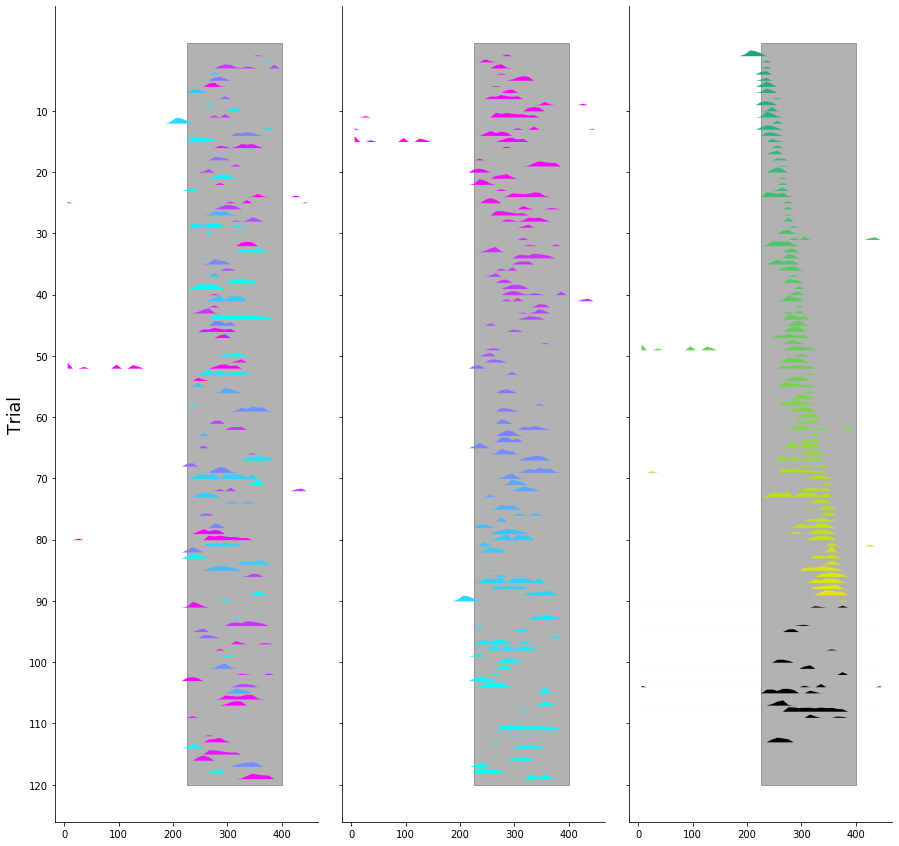

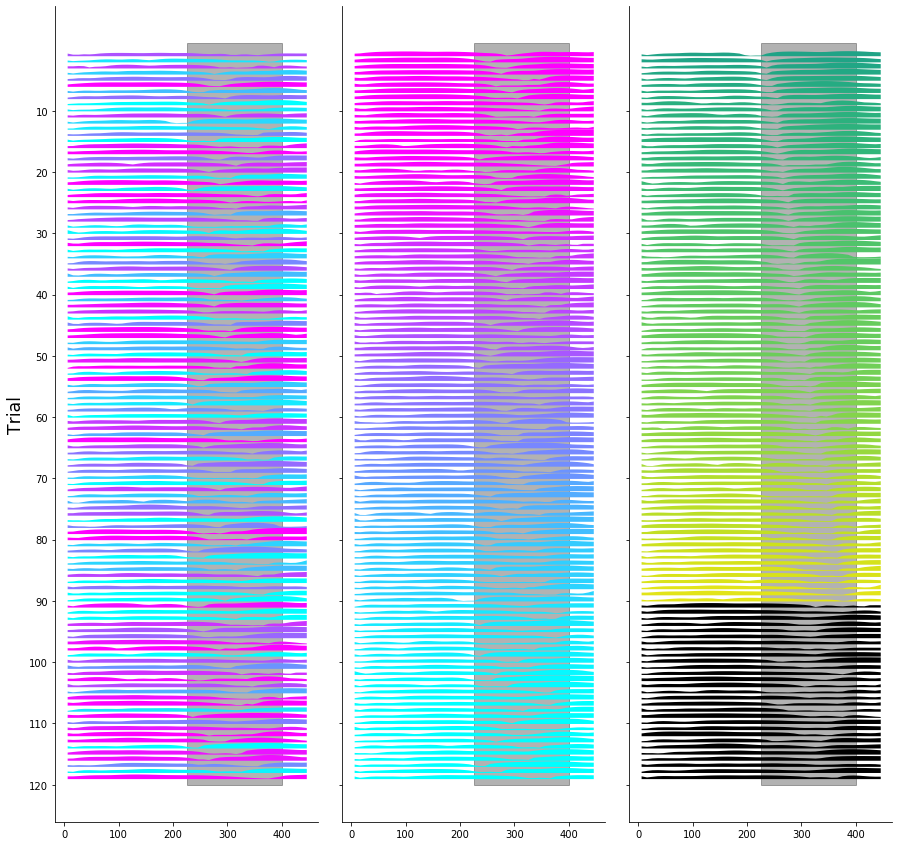

In [19]:
# licking and running behavior
effMorph = trial_info['morphs']+trial_info['wallJitter']
reward_pos = trial_info['rzone_entry']
reward_pos[np.isnan(reward_pos)]= 480

lick_trial_mat= u.make_pos_bin_trial_matrices(VRDat['lick']._values,
                                        VRDat['pos']._values,
                                        tstart_inds,
                                        teleport_inds,
                                        mat_only=True,bin_size=10)
# lick_morph_dict = u.trial_type_dict(lick_trial_mat,trial_info['morphs'])
max_pos = np.copy(trial_info['max_pos'])
max_pos[max_pos>440]=np.nan

# plot speed data
speed_trial_mat = u.make_pos_bin_trial_matrices(VRDat['speed']._values,
                                                VRDat['pos']._values,
                                                tstart_inds,
                                                teleport_inds,
                                                mat_only=True,bin_size=10)
# speed_morph_dict = u.trial_type_dict(speed_trial_mat,trial_info['morphs'])


f_lick, axarr_lick = b.behavior_raster_foraging(lick_trial_mat/np.nanmax(lick_trial_mat.ravel()),
                                                    centers,effMorph,reward_pos/390.,smooth=False)

f_speed,axarr_speed = b.behavior_raster_foraging(speed_trial_mat/np.nanmax(speed_trial_mat.ravel()),
                                                    centers,effMorph,reward_pos/390.,smooth=False)


In [20]:
# place cells
masks, FR, SI = pc.place_cells_calc(S, VRDat['pos']._values,trial_info,
                        tstart_inds, teleport_inds,
                        speed=VRDat.speed._values,
                        win_trial_perm=True,morphlist=np.unique(trial_info['morphs']).tolist())



perm 0


morph 0 place cells = 342 out of 1047 , 0.326648 
morph 1 place cells = 376 out of 1047, 0.359121


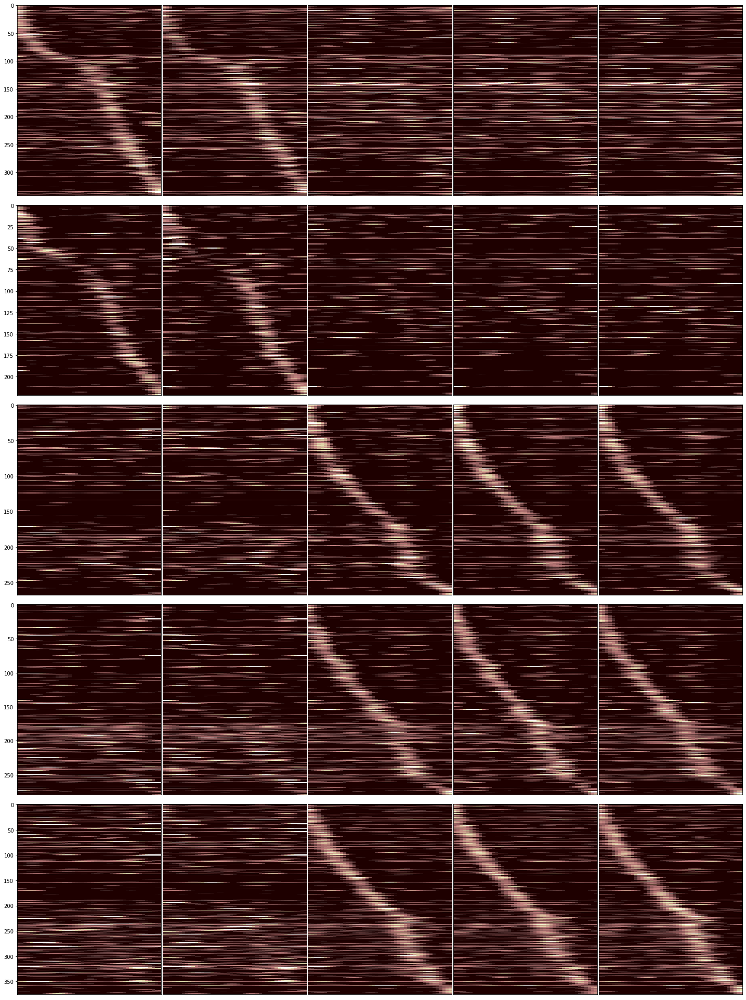

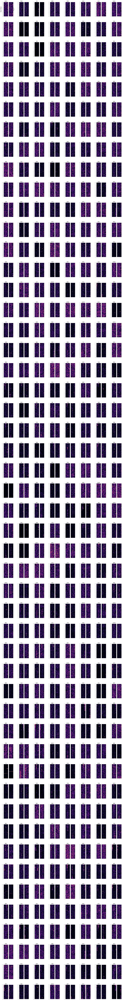

In [21]:
S_morph_dict = u.trial_type_dict(S_trial_mat,trial_info['morphs'])
# plot place cells by morph
f_pc, ax_pc,PC_dict = pc.plot_placecells(S_morph_dict,masks)

# number in each environment
print('morph 0 place cells = %g out of %g , %f ' % (masks[0].sum(), masks[0].shape[0], masks[0].sum()/masks[0].shape[0]))
print('morph 1 place cells = %g out of %g, %f' % (masks[1].sum(), masks[1].shape[0], masks[1].sum()/masks[1].shape[0]))

# single cell plots
f_singlecells = pc.plot_top_cells(S_trial_mat,masks,SI,effMorph)


0
27.788104094772493
13.724823034934161
11.176304915397237
8.929816749280857
8.851567078691675
7.4833709761555385
6.254807953264699
6.125537809435628


Text(0, 0.5, '$SF$')

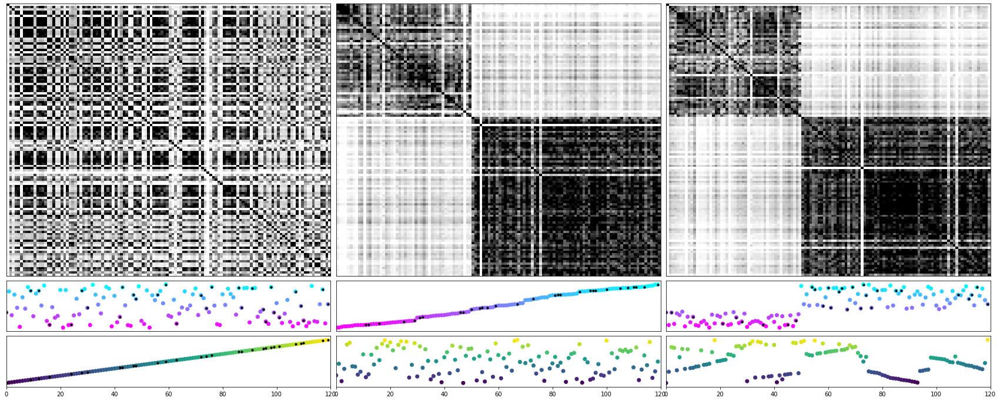

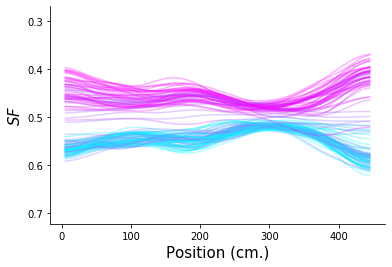

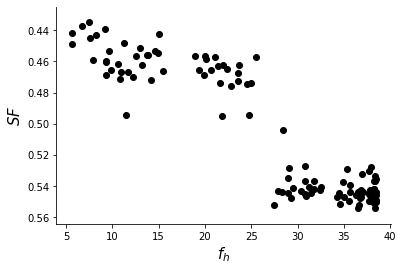

In [45]:
# trial x trial similarity matrix
S_trial_mat[np.isnan(S_trial_mat)]=0.
# S_trial_mat is trials x positions x neurons
S_trial_mat = sp.ndimage.filters.gaussian_filter1d(S_trial_mat,1,axis=1) # smooth position by 1 bin

#flatten to be trial x positions*neurons
S_tmat = np.reshape(S_trial_mat,[S_trial_mat.shape[0],-1])
# divide trials by l2-norm
S_tmat = S_tmat/np.linalg.norm(S_tmat,ord=2,axis=-1)[:,np.newaxis]
# outer product give trial x trial cosine similarity
S_t_rmat = np.matmul(S_tmat,S_tmat.T)
print((S_t_rmat<0).sum())
f_stsm,axtup_stsm = sm.plot_trial_simmat(S_t_rmat,trial_info)

# similarity fraction vs position
rtsf = u.rt_similarity_fraction(S_trial_mat,trial_info,sigma=0)
f, rtsf_ax = plt.subplots()
for t in range(rtsf.shape[0]):
    rtsf_ax.plot(np.arange(5,450,10),rtsf[t,:],alpha=.3,c=plt.cm.cool(1-effMorph[t]))
            
rtsf_ax.spines['top'].set_visible(False)
rtsf_ax.spines['right'].set_visible(False)
rtsf_ax.set_ylim([np.nanmax(rtsf.ravel())+.1,np.nanmin(rtsf.ravel())-.1])
rtsf_ax.set_xlabel("Position (cm.)",fontsize=15)
rtsf_ax.set_ylabel("$SF$",fontsize=15)

# summary similarity fraction
sf = u.similarity_fraction(S_trial_mat,trial_info)
f, sf_ax = plt.subplots()
sf_ax.scatter(morph_analyses.UnityTransforms.xfreq(effMorph),sf,color='black') #,c=plt.cm.cool(1-effMorph))
sf_ax.set_ylim([np.nanmax(sf)+.01,np.nanmin(sf)-.01])
sf_ax.spines['top'].set_visible(False)
sf_ax.spines['right'].set_visible(False)
sf_ax.set_xlabel("$f_h$",fontsize=15)
sf_ax.set_ylabel("$SF$",fontsize=15)